In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, minmax_scale

In [3]:
data = pd.read_csv("./유방암.csv", engine='python')
data.head()

,diagnosis,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
data.shape

(569, 31)

In [5]:
data.isnull().sum(axis = 0)

diagnosis                  0
mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
dtype: int64

In [6]:
table = str.maketrans(' ', '_')
rename_dict = { col:col.lower().translate(table)  for col in data.columns}

data.rename(columns=rename_dict,inplace=True)
data.columns

Index(['diagnosis', 'mean_radius', 'mean_texture', 'mean_perimeter',
       'mean_area', 'mean_smoothness', 'mean_compactness', 'mean_concavity',
       'mean_concave_points', 'mean_symmetry', 'mean_fractal_dimension',
       'radius_error', 'texture_error', 'perimeter_error', 'area_error',
       'smoothness_error', 'compactness_error', 'concavity_error',
       'concave_points_error', 'symmetry_error', 'fractal_dimension_error',
       'worst_radius', 'worst_texture', 'worst_perimeter', 'worst_area',
       'worst_smoothness', 'worst_compactness', 'worst_concavity',
       'worst_concave_points', 'worst_symmetry', 'worst_fractal_dimension'],
      dtype='object')

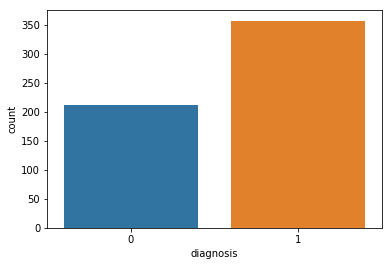

In [7]:
sns.countplot(data.diagnosis,label="Count")

diagnosis
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: mean_radius, dtype: object

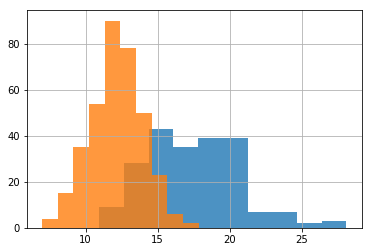

In [8]:
data.groupby("diagnosis")["mean_radius"].hist(alpha=0.8)

In [9]:
data_dia_0 = data[data.diagnosis == 0]
data_dia_0.shape

(212, 31)

In [10]:
data_dia_1 = data[data.diagnosis == 1]
data_dia_1.shape

(357, 31)

In [11]:
def remove_outlier(data):
    Q1 = data.quantile (0.25) 
    Q3 = data.quantile (0.75) 
    IQR = Q3-Q1
    
    return(data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)])

In [12]:
data_dia_0 = remove_outlier(data_dia_0)
data_dia_1 = remove_outlier(data_dia_1)
print(data_dia_0.shape,data_dia_1.shape)

(151, 31) (254, 31)


In [13]:
data = pd.concat([data_dia_0,data_dia_1])
data_y = data.diagnosis.reset_index().drop('index',axis=1)
# data_y
data_x = data.drop('diagnosis',axis=1)
data_n_2 = pd.DataFrame(scale(data_x),columns=data_x.columns)
# # pd.concat([data_y,data_n_2],axis=1).head()
data_x = pd.concat([data_y,data_n_2],axis=1)
data_x_plot = pd.melt(data_x,id_vars="diagnosis", var_name="features", value_name='value')

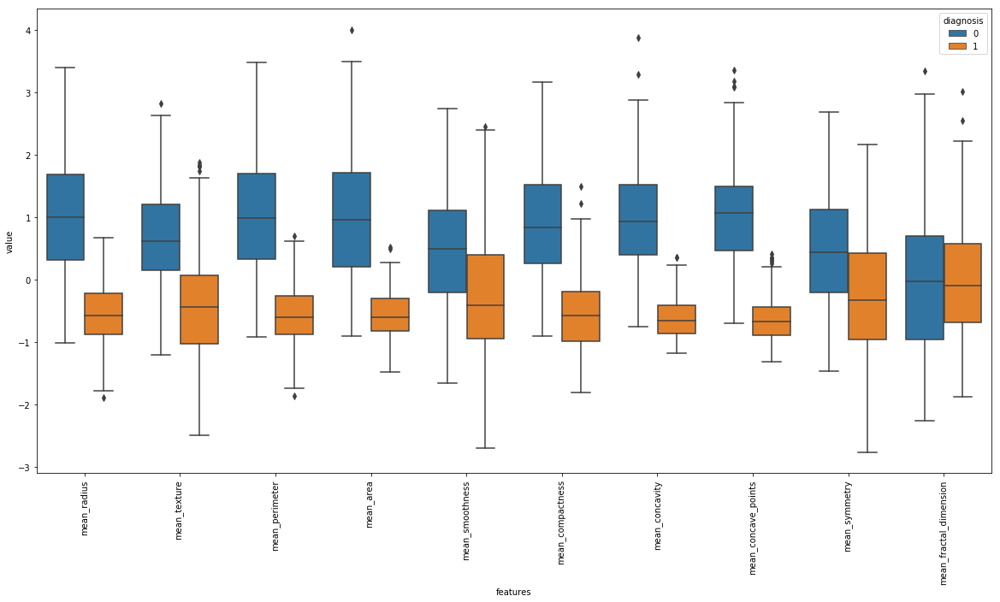

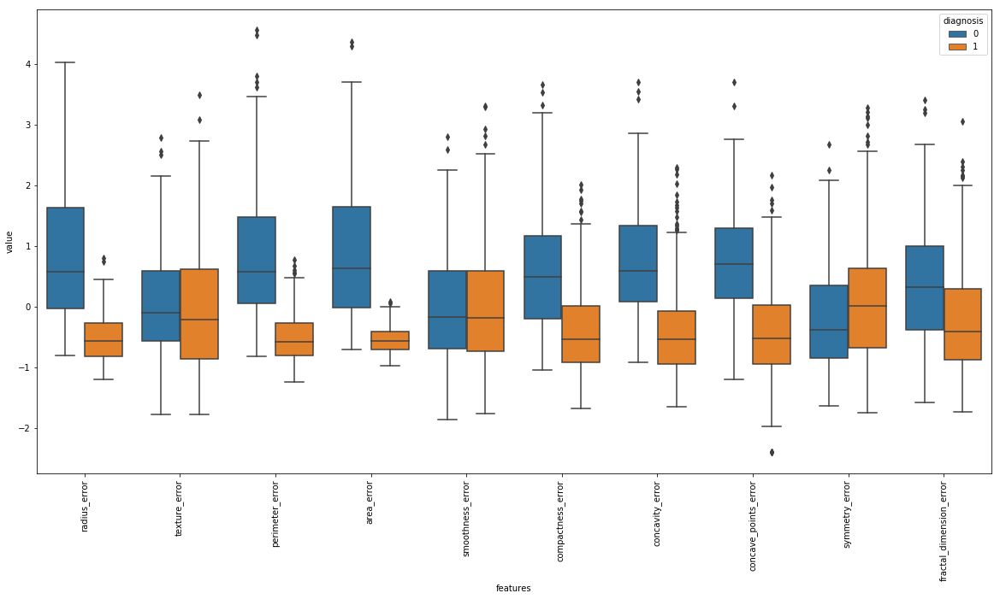

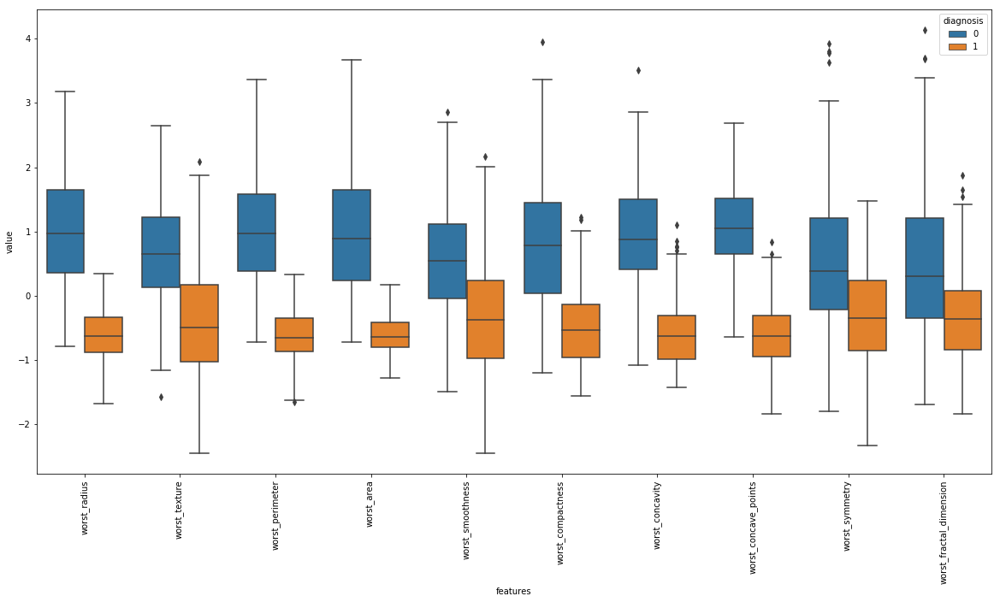

In [14]:
for n in range(data_x.shape[1]//10):
    plt.figure(figsize=(20,10))
    sns.boxplot(x="features", y="value", hue="diagnosis", data=data_x_plot.iloc[(n*10)*data_x.shape[0]:((n+1)*10)*data_x.shape[0],:])
    plt.xticks(rotation=90)

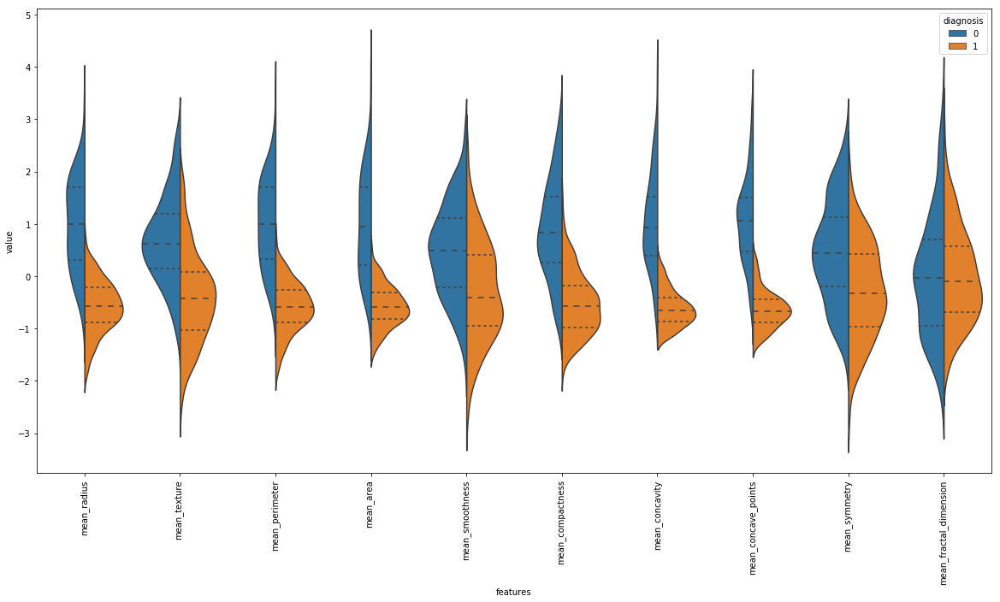

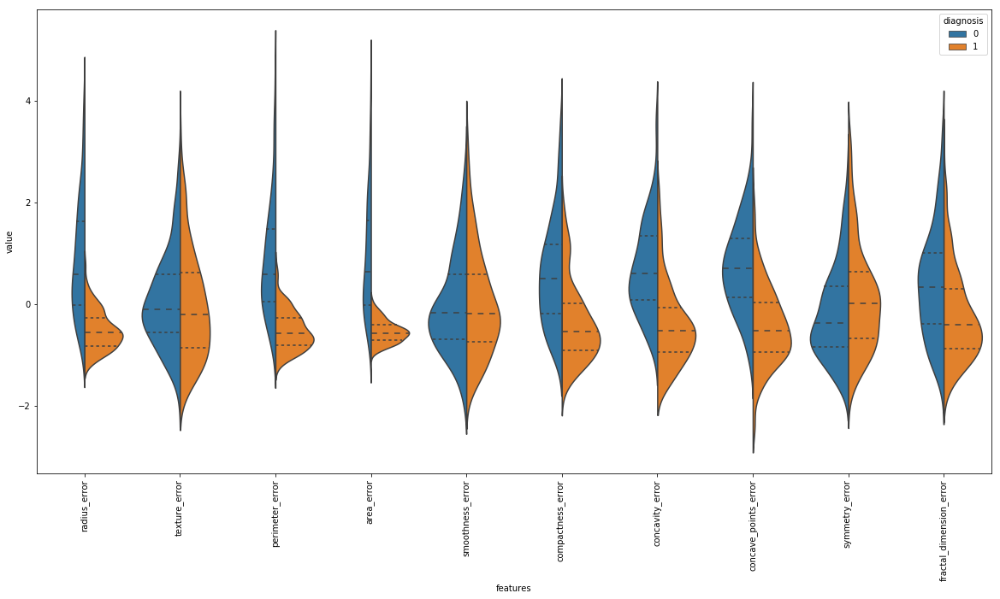

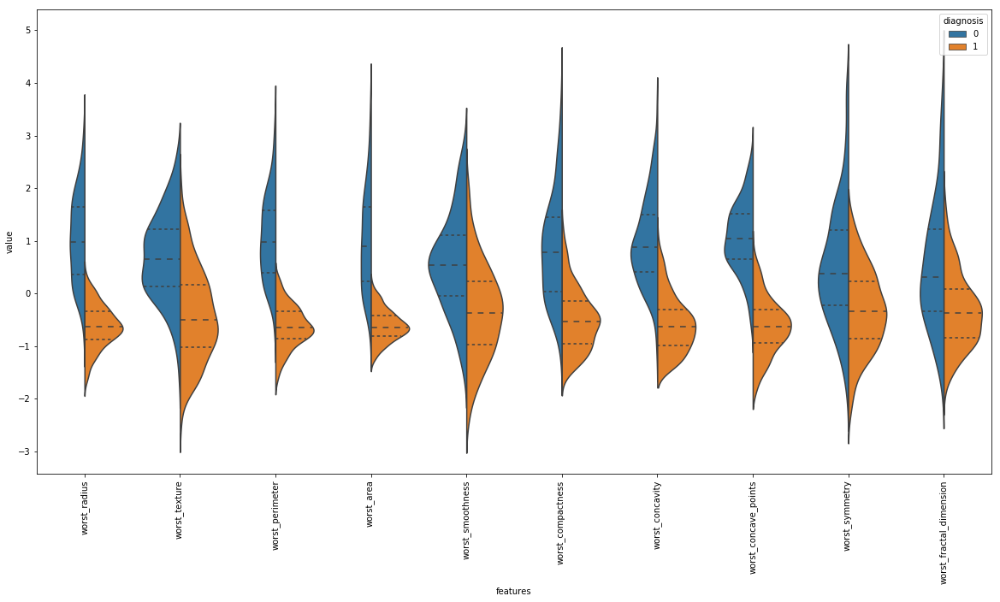

In [15]:
for n in range(data_x.shape[1]//10):
    plt.figure(figsize=(20,10))
    sns.violinplot(x="features", y="value", hue="diagnosis", data=data_x_plot.iloc[(n*10)*data_x.shape[0]:((n+1)*10)*data_x.shape[0],:],split=True, inner="quart")
    plt.xticks(rotation=90)

/home/pirl/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


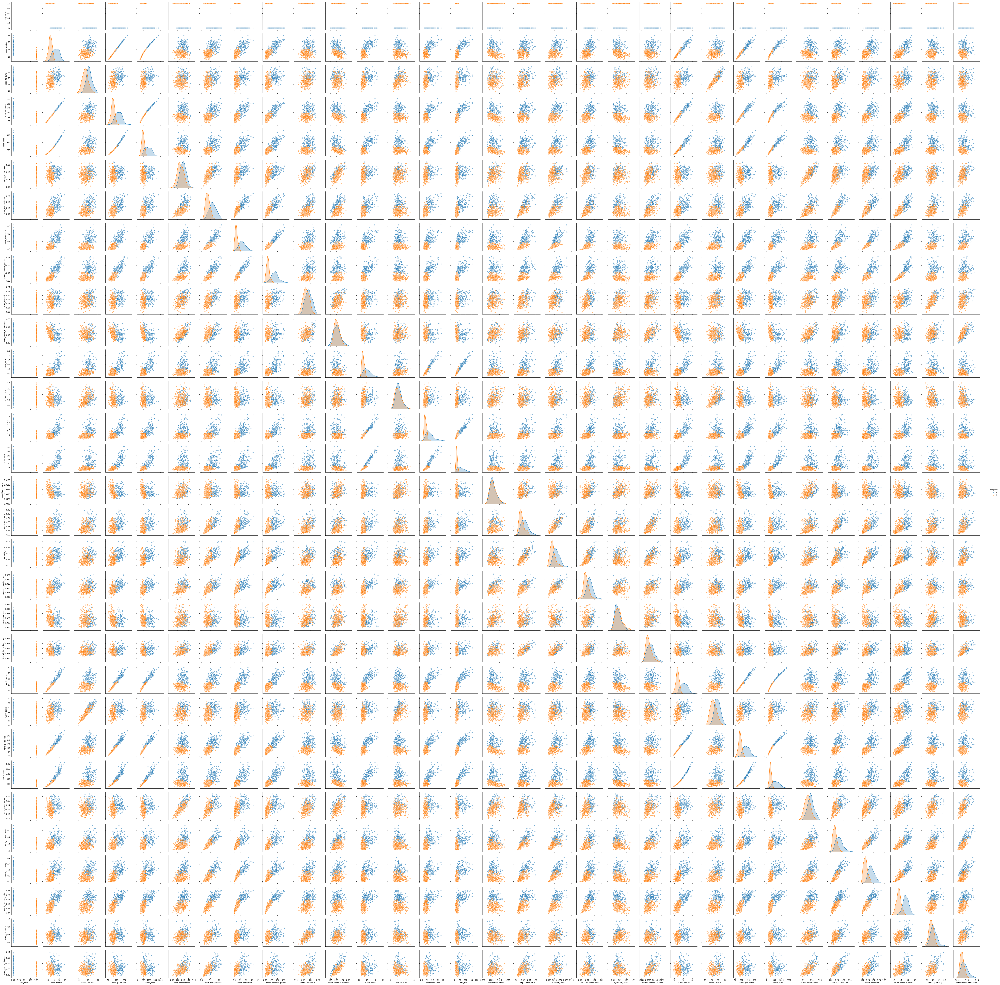

In [16]:
sns.pairplot(data,hue="diagnosis",plot_kws=dict(alpha=0.6))

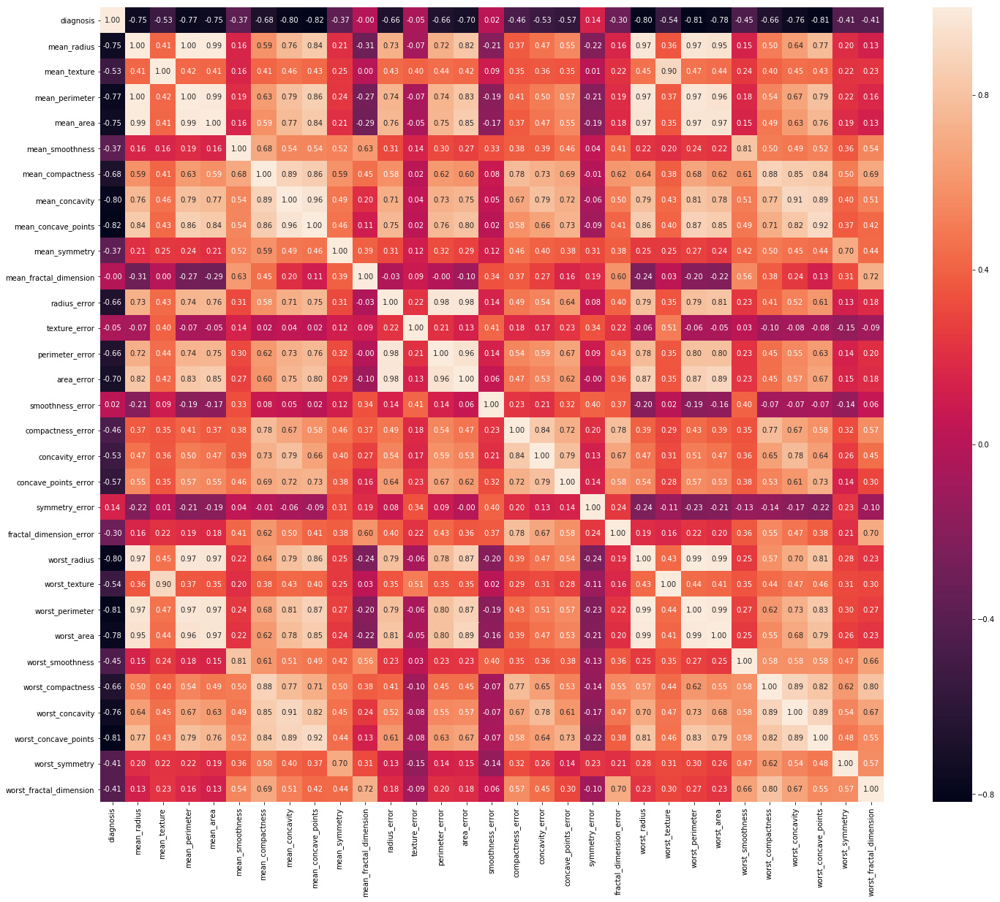

In [17]:
plt.figure(figsize=(24,20))
sns.heatmap(data.corr(),annot=True, fmt='.2f')

In [18]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# df_x_const = sm.add_constant(data.drop(["diagnosis"],axis=1,inplace=False))
# df_vif = pd.DataFrame()
# df_vif["variable"] = df_x_const.columns
# df_vif["vif"] = [variance_inflation_factor(df_x_const.values,i) for i in range(df_x_const.shape[1])]
# df_vif.sort_values("vif", inplace=True)
# df_vif.round(3)

,variable,vif
9,mean_symmetry,3.929
19,symmetry_error,5.172
15,smoothness_error,5.601
12,texture_error,6.712
5,mean_smoothness,9.757
29,worst_symmetry,9.794
10,mean_fractal_dimension,10.907
20,fractal_dimension_error,13.740
2,mean_texture,14.470
25,worst_smoothness,14.698


In [21]:
np.random.seed(seed=1234)
msk = np.random.rand(data.shape[0],) < 0.7
train = data[msk]
test = data[~msk]

In [22]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score

param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'min_samples_split': [2,3,4,5,6,7,8,9,10], 
              'min_samples_leaf':[2,3,4,5,6,7,8,9,10] }
model= DecisionTreeClassifier()

clf = GridSearchCV(model,param_grid,cv=10,scoring="accuracy")
clf.fit(train.drop("diagnosis",axis=1),train.diagnosis)


/home/pirl/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_features': ['auto', 'sqrt', 'log2'], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [23]:
clf.cv_results_["params"]

[{'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 4},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 5},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 6},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 7},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 8},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 9},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 10},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 2},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 3},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 4},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 5},
 {'max_features': 'auto', 'min_sample

In [24]:
clf.cv_results_["mean_test_score"]

array([0.93014706, 0.94852941, 0.9375    , 0.9375    , 0.94117647,
       0.94117647, 0.95955882, 0.95220588, 0.9375    , 0.95220588,
       0.95588235, 0.94485294, 0.95955882, 0.95220588, 0.9375    ,
       0.95220588, 0.9375    , 0.94485294, 0.94485294, 0.92647059,
       0.93014706, 0.9375    , 0.94852941, 0.94485294, 0.91911765,
       0.94485294, 0.94485294, 0.94485294, 0.92647059, 0.93014706,
       0.93014706, 0.94117647, 0.9375    , 0.91544118, 0.9375    ,
       0.94117647, 0.96323529, 0.94485294, 0.91911765, 0.91544118,
       0.92647059, 0.92279412, 0.93014706, 0.91176471, 0.96323529,
       0.92647059, 0.93014706, 0.93382353, 0.92647059, 0.94117647,
       0.94117647, 0.92279412, 0.94117647, 0.9375    , 0.91911765,
       0.91911765, 0.93382353, 0.90441176, 0.87867647, 0.94485294,
       0.93014706, 0.93382353, 0.94117647, 0.90073529, 0.94117647,
       0.9375    , 0.93014706, 0.95588235, 0.9375    , 0.93014706,
       0.91176471, 0.91544118, 0.91176471, 0.94117647, 0.90808

In [25]:
clf.best_params_
# clf.best_estimator_
# clf.best_score_

{'max_features': 'auto', 'min_samples_leaf': 6, 'min_samples_split': 2}

In [26]:
from sklearn.metrics import accuracy_score
predictions = clf.predict(test.drop("diagnosis",axis=1))
print(accuracy_score(test.diagnosis, predictions))

0.924812030075188


/home/pirl/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


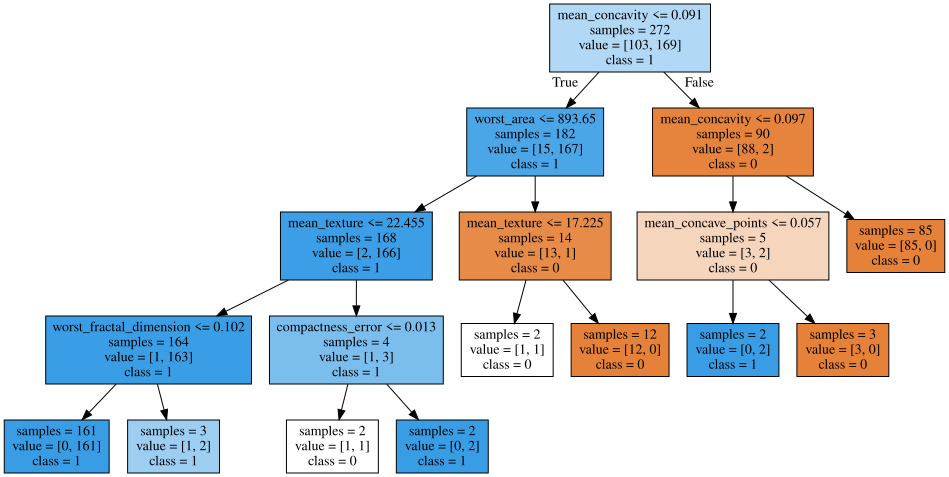

In [27]:
from sklearn.tree import export_graphviz
import graphviz

clf.fit(train.drop("diagnosis",axis=1),train.diagnosis)

export_graphviz(clf.best_estimator_,out_file="clf.dot", class_names=['0','1'], feature_names=data.drop("diagnosis",axis=1).columns,impurity=False, filled=True)

with open("clf.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))